From https://github.com/nlptown/nlp-notebooks/blob/master/Data%20exploration%20with%20sentence%20similarity.ipynb

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
# 1st - DataSet
# import pandas as pd
# my_path = "/content/drive/My Drive/movie-dialog-corpus/consumer_complaint.xlsx"

# data = pd.read_excel(my_path).sample(n=100,replace=False).reset_index()[['Product', 'Consumer_complaint_narrative']]
# texts = [review for review in data['Consumer_complaint_narrative']]
# label = [review for review in data['Product']]

# 2nd - DataSet
import csv
import random

f = "/content/drive/My Drive/movie-dialog-corpus/movie_lines.tsv"

texts = []
with open(f) as i:
    csv_reader = csv.reader(i, delimiter="\t")
    for line in csv_reader:
        texts.append(line[-1])
    
random.seed(1)
random.shuffle(texts)
texts = texts[:10000]
texts[:10]

["And what have I done to her besides not buy her a new fur coat lately?  Sidney you were right -- the boy's a dilly.",
 'How many with you?',
 'Yes for both.',
 'We know...  Send the book to evidence...',
 'Oh god...',
 'I bet you could do a book.',
 "Hello?  It's just me and you again.",
 'Yes I do.  I found your file.  I know what happened.',
 "I don't think we have anything for you here.  You're obviously in the wrong place.",
 'They look nice.']

In [3]:
import tensorflow_hub as hub
import tensorflow as tf
import numpy as np

tf.logging.set_verbosity(tf.logging.ERROR)
embed = hub.Module("https://tfhub.dev/google/universal-sentence-encoder/2")


def embed_texts(texts):

    # Reduce logging output.
    tf.logging.set_verbosity(tf.logging.ERROR)

    with tf.Session() as session:
        session.run([tf.global_variables_initializer(), tf.tables_initializer()])
        embeddings = session.run(embed(texts))

    return np.array(embeddings).tolist()

embeddings = embed_texts(texts)

W0514 16:01:58.004040 140151922657152 __init__.py:56] Some hub symbols are not available because TensorFlow version is less than 1.14


In [0]:
from sklearn.manifold import TSNE

mapped_embeddings = TSNE(n_components=2, metric='cosine', init='pca').fit_transform(embeddings)

In [0]:
mapped_embeddings_3D = TSNE(n_components=3, metric='cosine', init='pca').fit_transform(embeddings)

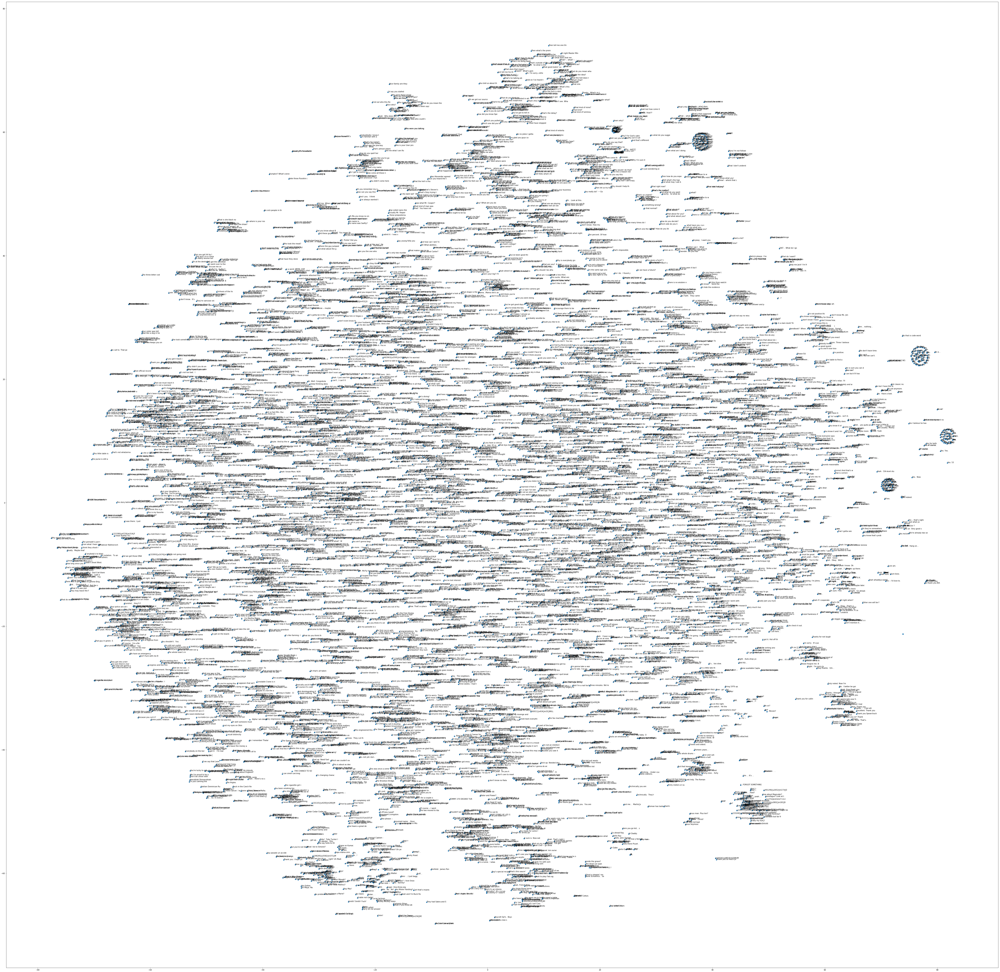

In [6]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.figure(figsize=(100,100))
x = mapped_embeddings[:,0]
y = mapped_embeddings[:,1]
plt.scatter(x, y)

for i, txt in enumerate(texts):
    plt.annotate(txt[:20], (x[i], y[i]))

plt.savefig('/content/drive/My Drive/movie-dialog-corpus/sentence_embedding.png')

In [0]:
import re

embedding_file = "sentence_embeddings.kv"
with open(embedding_file, "w") as o:
    o.write(f'{len(embeddings)} {len(embeddings[0])}\n')
    for text, embedding in zip(texts[:len(embeddings)], embeddings):
        text = re.sub("\s+", "_", text)
        string_embedding = " ".join([str(v) for v in embedding])
        o.write(f'{text} {string_embedding}\n')

In [8]:
from gensim.models import KeyedVectors

sentence_vectors = KeyedVectors.load_word2vec_format('sentence_embeddings.kv', binary=False)

W0514 16:40:52.717248 140151922657152 smart_open_lib.py:385] this function is deprecated, use smart_open.open instead
W0514 16:40:52.801296 140151922657152 utils_any2vec.py:183] duplicate word 'No.' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:52.851256 140151922657152 utils_any2vec.py:183] duplicate word 'Who?' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:53.030951 140151922657152 utils_any2vec.py:183] duplicate word 'Yeah.' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:53.073781 140151922657152 utils_any2vec.py:183] duplicate word 'Why?' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:53.125514 140151922657152 utils_any2vec.py:183] duplicate word 'Uh-huh.' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:53.138680 140151922657152 utils_any2vec.py:183] duplicate word 'Why?' in sentence_embeddings.kv, ignoring all but first
W0514 16:40:53.165824 140151922657152 utils_any2vec.py:183] duplicate word 'I_don't_kno

In [9]:
sentence_vectors.most_similar(positive=["Hello."])

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Hello?', 1.0),
 ('Hi.', 0.9402775764465332),
 ('Hey!_-', 0.9239135384559631),
 ('Hey!', 0.9239135384559631),
 ('Hey.', 0.9239135384559631),
 ('Oh_hi!', 0.8744990825653076),
 ('Hello_there_Picart.', 0.8689433336257935),
 ('Oh_hello.', 0.8454877138137817),
 ('Hey_mister.', 0.771081268787384),
 ("Okay._Let's_do_me.", 0.7594740986824036)]

In [0]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(n_clusters=1000, affinity="euclidean", linkage="ward")
clusters = clusterer.fit_predict(embeddings)

In [11]:
import pandas as pd

df = pd.DataFrame({"text": texts, "cluster": clusters})

for cl in [200, 500, 800]: 
    print(df.loc[df['cluster'] == cl])

                                     text  cluster
806                              Hey man.      200
1559                    Hello Exposition.      200
2036                  Oh. Hi how y'doing?      200
2051                         Hello Peter.      200
2656           Yeah... How ya doin' Pete?      200
3336               Hiya Freddie Corleone.      200
3547                             Hey kid.      200
3790                          Hey mister.      200
4158                            Hey man--      200
4242                            Oh hello.      200
4677                     Oh Mr. Den-n-by!      200
5277                  Hey!  Mr. big shot.      200
5781             Good evening Mr. deWitt.      200
6051                  Hello. Hello Maria.      200
6380                       Hello Marylin.      200
7473              Hey Sonny - You did it!      200
7500  Hey lcokit:  <u>any</u> business...      200
8278                            Hey Pete.      200
8489                  Hello the

In [0]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm

/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


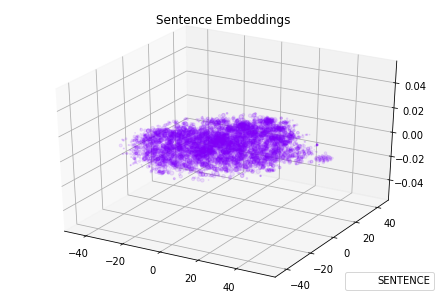

In [17]:
def tsne_plot_3d(title, label, embeddings, a=1):
    fig = plt.figure()
    ax = Axes3D(fig)
    colors = cm.rainbow(np.linspace(0, 1, 1))
    plt.scatter(mapped_embeddings_3D[:, 0], mapped_embeddings_3D[:, 1], mapped_embeddings_3D[:, 2], c=colors, alpha=a, label=label)
    plt.legend(loc=4)
    plt.title(title)
    plt.show()


tsne_plot_3d('Sentence Embeddings', 'SENTENCE', mapped_embeddings_3D, a=0.1)